# ПРОЕКТ: Рынок заведений общественного питания Москвы

#### Заказчик: Инвесторы из фонда «Shut Up and Take My Money» 
открытие заведение общественного питания в Москве. 
#### Цель:     
подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
#### Источник: 
датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

## 1. Загрузка данных и изучение общей информации

Импортируем библиотеки, которые понадобятся в дальнейшей работе, загружаем данные о заведениях общественного питания Москвы, а также выводим основную информацию о датафрейме

In [51]:
#Импортируем библиотеки
import pandas as pd
import os
pd.options.display.float_format = '{:,.2f}'.format 
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from folium import Map, Marker
from folium.plugins import MarkerCluster
import seaborn as sns
from folium import Map, Choropleth
import folium
import json
import matplotlib.pyplot as plt

In [52]:
# Считаем датасет и выведем первые 5 строк и общую информацию
pth1 = 'moscow_places.csv'
pth2 = '/datasets/moscow_places.csv'

if os.path.exists(pth1):
    df = pd.read_csv(pth1)
elif os.path.exists(pth2):
    df = pd.read_csv(pth2)
else:
    print('Something is wrong')

display(df.head())
df.info()


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [53]:
#Выводим список характерных значений, а также количество явных дубликатов
display(df.describe())
df.duplicated().sum()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,"8,406.00","8,406.00","8,406.00","3,149.00",535.00,"8,406.00","4,795.00"
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,"1,009.73",88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,"1,250.00",225.00,1.00,140.00
max,55.93,37.87,5.00,"35,000.00","1,568.00",1.00,"1,288.00"


0

Выведем долю пропусков, для наглядности, закрасив градиентом

In [54]:
pd.DataFrame(round(df.isna().mean()*100, 1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


In [55]:
#Выведем количество заведений с уникальными названиями
len(df['name'].unique())

5614

* В датафрейме 8406 строк и 14 столбцов
* В столбце `name` - 5614 уникальных названий заведений, возможно это связано с наличием сетевых заведений или по причине популярности названий некоторых заведений
* Отсутствуют явные дубликаты
* Столбец `middle_avg_bill` имеет слишком высокое стандартное отклонение - 1009.73 

* Данные пропущены в 6 столбцах, среди которых столбец `middle_coffee_cup` на 93.6% имеет пустые значения:
    1.   `hours` - информация о днях и часах работы;
    2.   `price` - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    3.   `avg_bill` - строка, которая хранит среднюю стоимость заказа в виде диапазона;
    4.   `middle_avg_bill` - — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
    5.   `middle_coffee_cup` -  число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
    6.   `seats` -  количество посадочных мест

Рассмотрим уникальные значения столбцов `rating`, `middle_avg_bill`, `middle_coffee_cup`, `chain`, `seats`

In [56]:
print('уникальные значения столбца rating \n')
print(df['rating'].unique())
print('\n уникальные значения столбца middle_avg_bill \n')
print(df['middle_avg_bill'].unique())
print('\n уникальные значения столбца middle_coffee_cup \n')
print(df['middle_coffee_cup'].unique())
print('\n уникальные значения столбца chain \n')
print(df['chain'].unique())
print('\n уникальные значения столбца seats \n')
print(df['seats'].unique())


уникальные значения столбца rating 

[5.  4.5 4.6 4.4 4.7 4.8 4.3 4.9 4.2 4.1 4.  3.8 3.9 3.7 3.6 2.8 2.7 3.1
 1.5 2.  1.4 3.3 3.5 3.2 2.9 3.  3.4 2.3 2.2 2.5 2.6 1.7 1.  1.1 2.4 1.3
 1.2 2.1 1.8 1.9 1.6]

 уникальные значения столбца middle_avg_bill 

[      nan 1.550e+03 1.000e+03 5.000e+02 1.990e+02 2.500e+02 1.100e+03
 3.300e+02 1.500e+03 4.000e+02 2.450e+02 4.250e+02 9.000e+02 2.400e+02
 2.250e+02 3.280e+02 3.000e+02 3.450e+02 2.300e+02 6.500e+02 7.500e+02
 1.250e+03 1.750e+03 2.250e+03 6.000e+02 4.500e+02 8.500e+02 2.100e+03
 3.490e+02 2.000e+02 1.200e+02 2.690e+02 1.300e+03 1.150e+03 3.550e+02
 2.750e+02 1.200e+03 5.750e+02 3.500e+02 7.000e+02 2.840e+02 1.500e+02
 3.620e+02 3.250e+02 2.000e+03 2.910e+02 2.800e+02 2.750e+03 1.400e+03
 2.500e+03 2.150e+03 5.000e+03 8.250e+02 6.250e+02 3.250e+03 6.750e+02
 4.750e+02 1.690e+03 9.250e+02 1.050e+03 3.400e+02 9.500e+02 1.025e+03
 3.210e+02 5.500e+02 3.600e+02 3.750e+02 3.170e+02 3.240e+02 3.430e+02
 1.400e+02 1.650e+02 2.150e+02 5.490e

Исходя из данных списка характерных значений, а также после рассматривания всех уникальных значений столбцов :
* `rating` - тип данных float64  можно изменить формат на меньший размер float16
* `middle_avg_bill` на   float16
*  `middle_coffee_cup`  на   float16
* `chain` на bool
* `seats` на float16

Изменим типы данных как описано выше, и выведем таблицу с общей информацией для проверки

In [57]:
#Изменяем типы данных и выводим таблицу с общей информацией о датафрейме
df['rating'] = df['rating'].astype('float16')
df['middle_avg_bill'] = df['middle_avg_bill'].astype('float16')
df['middle_coffee_cup'] = df['middle_coffee_cup'].astype('float16')
df['chain'] = df['chain'].astype(bool)
df['seats'] = df['seats'].astype('float16')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float16
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float16
 11  middle_coffee_cup  535 non-null    float16
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   float16
dtypes: bool(1), float16(4), float64(2), object(7)
memory usage: 665.1+ KB


## Шаг 2. Выполните предобработку данных
* Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?
* Выполните предобработку данных:
* Создайте столбец street с названиями улиц из столбца с адресом.
* Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
        * логическое значение True — если заведение работает ежедневно и круглосуточно;
        *  логическое значение False — в противоположном случае.


Для начала уберем все верхние регистры с столбцов

In [58]:
df['name'] = df['name'].str.lower()
df['category'] = df['category'].str.lower()
df['address'] = df['address'].str.lower()
df['hours'] = df['hours'].str.lower()
df['price'] = df['price'].str.lower()
df['avg_bill'] = df['avg_bill'].str.lower()

Далее проверим на наличие дубликатов по имени и адресу

In [59]:
df.loc[df.duplicated(subset = ['name', 'address']) == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,False,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,NaN,NaN,True,188.00
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,NaN,NaN,True,150.00
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,False,276.00


Выведем все строки имеющие дубликаты и сравним их

In [60]:
display(df.loc[(df['name'] == 'кафе') & (df['address'] == 'москва, парк ангарские пруды')] )
display(df.loc[(df['name'] == 'more poke') & (df['address'] == 'москва, волоколамское шоссе, 11, стр. 2')] )
display(df.loc[(df['name'] == 'раковарня клешни и хвосты') & (df['address'] == 'москва, проспект мира, 118')] )
display(df.loc[(df['name'] == 'хлеб да выпечка') & (df['address'] == 'москва, ярцевская улица, 19')] )


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,False,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,False,NaN


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,False,188.00
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,NaN,NaN,True,188.00


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,False,150.00
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,NaN,NaN,True,150.00


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,NaN,NaN,True,276.00
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,False,276.00


Мы нашли неявные дубликаты, которые далее удаляем их и сбрасываем индексы

In [61]:
print(df.shape)
df = df.loc[df.duplicated(subset = ['name', 'address']) == False]
df = df.reset_index(drop = True)
df.shape

(8406, 14)


(8402, 14)

Еще раз выведем таблицу с долей пропусков:

In [62]:
pd.DataFrame(round(df.isna().mean()*100, 1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.500000
avg_bill,54.600000


А также столбчатую диаграмму для наглядности

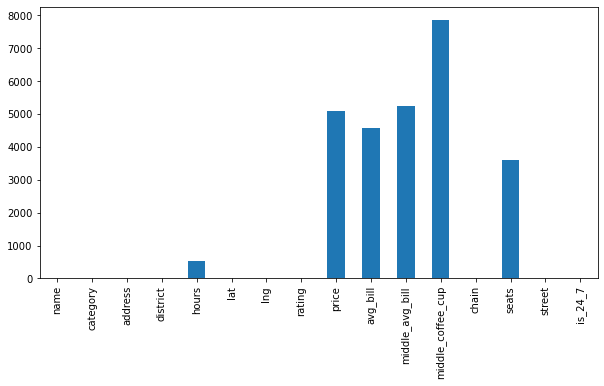

In [113]:
(df.isna().sum()).plot(y = 'title', kind= 'bar', figsize = (10,5));

Пропуски имеются в столбцах:
* С информацией о днях и часах работы,  
* С категориями цен в заведении(«средние», «ниже среднего», «выше среднего»)
* С средней стоимостью заказа в виде диапазона
* С количеством посадочных мест в заведении

Которые нет возможности заполнить данными

Рассмотрим столбцы `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`.

Так как столбцы `middle_avg_bill`, `middle_coffee_cup` заполняются исходя данных из столбца `avg_bill`, проверим есть ли пропуски. Для начала рассмотрим все уникальные значения столбца `avg_bill`

In [64]:
df['avg_bill'].unique()

array([nan, 'средний счёт:1500–1600 ₽', 'средний счёт:от 1000 ₽',
       'цена чашки капучино:155–185 ₽', 'средний счёт:400–600 ₽',
       'средний счёт:199 ₽', 'средний счёт:200–300 ₽',
       'средний счёт:от 500 ₽', 'средний счёт:1000–1200 ₽',
       'цена бокала пива:250–350 ₽', 'средний счёт:330 ₽',
       'средний счёт:1500 ₽', 'средний счёт:300–500 ₽',
       'средний счёт:140–350 ₽', 'средний счёт:350–500 ₽',
       'средний счёт:300–1500 ₽', 'средний счёт:от 240 ₽',
       'средний счёт:200–250 ₽', 'средний счёт:328 ₽',
       'средний счёт:300 ₽', 'средний счёт:от 345 ₽',
       'средний счёт:60–400 ₽', 'средний счёт:900 ₽',
       'средний счёт:500–800 ₽', 'средний счёт:500–1000 ₽',
       'средний счёт:600–700 ₽', 'цена бокала пива:120–350 ₽',
       'средний счёт:1000–1500 ₽', 'средний счёт:1500–2000 ₽',
       'цена чашки капучино:150–190 ₽', 'средний счёт:2000–2500 ₽',
       'средний счёт:600 ₽', 'средний счёт:450 ₽',
       'цена чашки капучино:120–170 ₽', 'средний счё

Исходя из списка уникальных значений столбца `avg_bill`, можно выделить 3 категории значений:
* средний счет
* цена чашки капучино
* цена бокала пива

Проверим наличие пропусков в столбце `middle_avg_bill`, где в столбце `avg_bill` содержится "счёт". Для этого выведем все строки, где в столбце `middle_avg_bill` пустое значение и в столбце `avg_bill` содержится "счёт"

In [65]:
df.loc[(df['middle_avg_bill'].isna() == True) & (df['avg_bill'].str.contains("счёт") == True) ]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Таких строк нет.

Таким же образом проверим строки, где имеет пустое значение в столбце `middle_coffee_cup` и в столбце `avg_bill` содержится "капучино"

In [66]:
df.loc[(df['middle_coffee_cup'].isna() == True) & (df['avg_bill'].str.contains("капучино") == True)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Таких строк тоже не оказалось, таким образом, приходим к выводу что пустые значения данных столбцов мы не можем заполнить какими либо данными

Создадим столбец `street` с названиями улиц из столбца с адресом, для этого используем функцию, которая разделяет через ',' и вернем `1` значение


In [67]:
def find_street(value):
    i = value.split(', ')
    return i[1]
df['street'] = df['address'].apply(find_street)

Проверим, выведем первые 5 строк датафрейма

In [68]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,False,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,"1,550.00",NaN,False,4.00,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,"1,000.00",NaN,False,45.00,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,False,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,True,148.00,правобережная улица


Далее создадим столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
  * логическое значение True — если заведение работает ежедневно и круглосуточно;
  *  логическое значение False — в противоположном случае.
  
 И выведем первые 5 строк заведений, которые работают ежедневно и круглосуточно

In [69]:
df['is_24_7'] = (df['hours'].str.contains('ежедневно')) & (df['hours'].str.contains('круглосуточно'))

In [70]:
df.query('is_24_7 == True').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
10,great room bar,"бар,паб","москва, левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.88,37.47,4.50,средние,цена бокала пива:250–350 ₽,NaN,NaN,False,102.00,левобережная улица,True
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.88,37.45,4.40,средние,средний счёт:350–500 ₽,425.00,NaN,False,96.00,ленинградское шоссе,True
19,пекарня,булочная,"москва, ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.89,37.52,4.40,NaN,NaN,NaN,NaN,True,NaN,ижорский проезд,True
24,drive café,кафе,"москва, улица дыбенко, 9ас1",Северный административный округ,"ежедневно, круглосуточно",55.88,37.48,4.00,NaN,NaN,NaN,NaN,True,NaN,улица дыбенко,True
49,2u-ту-ю,пиццерия,"москва, ижорская улица, 8а",Северный административный округ,"ежедневно, круглосуточно",55.89,37.51,2.70,NaN,средний счёт:900 ₽,900.00,NaN,False,NaN,ижорская улица,True


## Шаг 3. Анализ данных
* Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.
* Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.
* Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
* Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.
* Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам.
* Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.
* Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
* Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).
* Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
* Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.
* Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
* Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?
* Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.
* Соберите наблюдения по вопросам выше в один общий вывод.


**Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.**

 Для начала выведем все уникальные значения столбца `category`

In [71]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Всего 8 категорий общественного питания представлены в данных:
1. кафе
2. ресторан
3. кофейня
4. пиццерия
5. бар, паб
6. быстрое питание
7. булочная
8. столовая

Выведем количество общественных заведений по категориям, отсортировав значения по убыванию:


In [72]:
df.groupby('category')['name'].count().sort_values(ascending=False)

category
кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: name, dtype: int64

Для наглядности построим круговую а также столбчатую диаграммы доли категорий общественых заведений Москвы

In [73]:
fig = px.pie(df, names='category', title='Доля категорий заведений общественного питания Москвы',\
            color_discrete_sequence=px.colors.sequential.dense,\
            width=800, height=600)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [74]:
fig = px.bar( pd.pivot_table(df, index=['category'], values = ['name'], aggfunc='count').sort_values(by ='name', ascending = False ).reset_index(),\
            x = 'category',\
            y = 'name', title="Количество заведений по категориям",\
            labels={'category': 'Категория','name':'Количество заведений'})
fig.show()

В результате круговой диаграммы, видно, что наибольшую долю категорий составляют :
* "кафе" - 2376 заведений что состовляет 28.3% от всех общественных заведений в датафрейме, 
* "ресторан" - 24.3%, 
* "кофейня" - 16.8%, 
* "бар,паб" - 9.09% ,
* и остальные заведения которые в сумме образуют долю меньшую четверти от всех заведений датафрейма

**Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.**


Для этого выведем диаграмму размаха по количеству посадочных мест, распределенную по категориям заведений общественного питания 

In [75]:
fig = px.box(df, x = "category", y = 'seats',points="all",\
             title='Количество посадочных мест по категориям',
             color="category", width=900, height=600)
fig.layout.update(yaxis_range=(-10,800))
fig.update_layout(yaxis_title='Количество посадочных мест', xaxis_title='Категории')
fig.show()

По данным выведенной диаграммы размаха можно определить:
* Минимальное медианное значение имеет категория "булочная", то есть, самое минимальное количество посадочных мест среди категорий, является "булочная"
* Максимальное медианное значение имеет категория "ресторан", данная категория имеет наибольшее количество посадочных мест среди категорий
* Категории "ресторан", "кофейня", "бар, паб", а также "быстрое питание" имеют большой межквартильный размах, что означает что возможно наибольшее количество общественных заведений данных категорий находятся в основном в зданиях с группами предприятий торговли или развлечения

**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**


Сначала, нужно вывести долю количества всех сетевых и несетеых заведений, для этого построим круговую диаграмму

In [76]:
pivot = pd.pivot_table(df.replace({True:'Сетевое', False:'Несетевое'}), index=['chain'], values =['name'],aggfunc='count').sort_values(by='name', ascending=False).reset_index()
pivot

,chain,name
0,Несетевое,5199
1,Сетевое,3203


In [77]:
fig = go.Figure(data=[go.Pie(labels=pivot['chain'], values=pivot['name'], pull=[0, 0.1])]
           )
fig.update_traces(marker=dict(colors = ['#774aaf', '#bfdde5']))
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(margin=dict(t=80, b=0, l=0, r=0))
fig.update(layout_title_text='Разбивка предприятий общественного питания на сетевые и несетевые',
           layout_showlegend=False)
fig.show()

Сетевые заведения составляют чуть больше одной трети части от всего датафрейма - 38.1%

Далее нужно вывести количество всех сетевых и несетевых заведений, распределенных по категориям. Для этого используем сводную таблицу

In [78]:
is_chain = (pd.pivot_table(df, index=['chain','category'], aggfunc='count').reset_index().sort_values(by='name', ascending=False))

In [79]:
fig = px.bar(is_chain, x = is_chain.category,
                   y = is_chain.name, color = is_chain.chain.replace({True:'Сетевое', False:'Несетевое'}), title="Соотношение количества сетевых и несетевых заведений, распределенных по категориям",
                   labels={'category': 'Категория','name':'Количество заведений' ,'chain':'Сетевой/Несетевой'})
fig.show()

По результатам выведенного графика, определяем :
* Наибольшее количество сетевых заведений в категории "кафе"
* Наименьшее количество сетевых заведений в категории "столовая"
* Сетевыми заведениями в большинстве случаев являются категории "кафе", "ресторан", "кофейня" и "пиццерия"
* Все остальные категории имеют меньшее количество сетевых заведений 


In [80]:
fig = px.histogram(is_chain, x = is_chain.category,
                   y = is_chain.name, color = is_chain.chain.replace({True:'Сетевое', False:'Несетевое'}),
                   barnorm='percent', title="Процентное соотношение сетевых и несетевых заведений, распределенных по категориям",
                   labels={'category': 'Категория', 'chain':'Сетевой/Несетевой'}).update_layout(yaxis_title="Процент соотношения сетевых/несетевых заведений")
fig.show()

По результатам выведенного графика, процентного соотношения определяем :
* Среди категорий "кафе", "ресторан", "бар, паб", "быстрое питание" и "столовая" - от всего количества заведений определенных категорий, большая половина - является несетевым заведением
* Среди остальных категорий "кофейня", "пиццерия", "булочная" - наоборот, от всего количества заведений определенных категорий, большая половина - является сетевым заведением

In [81]:
is_chain = (pd.pivot_table(df, index=['chain','category'], aggfunc='count').sort_values(by = ["name", 'chain'], ascending= True).reset_index())


In [82]:
fig = px.histogram(is_chain.sort_values(by=['chain', 'name'], ascending = True ), x = is_chain.category, 
                   y = is_chain['name'], color = is_chain.chain.replace({True:'Сетевое', False:'Несетевое'}),
                   barnorm='percent'  ,title="Процентное соотношение сетевых и несетевых заведений, распределенных по категориям",
                   labels={'category': 'Категория', 'chain':'Сетевой/Несетевой'}).update_layout(yaxis_title="Процент соотношения сетевых/несетевых заведений")
fig.update_layout()
fig.show()

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам**

In [83]:
top15 = (pd.pivot_table(df[df['chain'] == True], index=['name'], values = ['category'], aggfunc='count').sort_values(by='category', ascending=False)).reset_index().head(15)
top15 

,name,category
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


In [84]:
fig = px.bar(top15, x = 'category',
                   y = 'name',title="Топ 15 популярных сетевых заведений в Москве",
                   labels={'category': 'Количество заведений','name':'Наименование сети заведений'})#, text_auto=True)
fig.show()

"Шоколадница" занимает первое место в топе15 популятных сетевых заведений в Москве, при том что по сравнению с "домино'с пицца" количество заведений в "шоколадница" значительно больше, более чем на 30%

Рассмотрим к какой категории заведений они относятся. Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [85]:
top15_table = df.loc[ df['name'].isin(top15['name'])== True ]
top15_table.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.50,4.80,NaN,NaN,NaN,NaN,True,180.00,базовская улица,False
23,буханка,булочная,"москва, лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.89,37.53,4.70,NaN,NaN,NaN,NaN,True,NaN,лобненская улица,False
32,додо пицца,пиццерия,"москва, коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.52,4.30,NaN,средний счёт:328 ₽,328.00,NaN,True,46.00,коровинское шоссе,False
34,домино'с пицца,пиццерия,"москва, клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.52,4.20,NaN,средний счёт:от 500 ₽,500.00,NaN,True,247.00,клязьминская улица,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.88,37.49,3.60,NaN,NaN,NaN,NaN,True,NaN,улица маршала федоренко,False


In [86]:
top15_pivot_category = (pd.pivot_table(top15_table, index=['category'], values =['name'],aggfunc='count').sort_values(by='name', ascending=False).reset_index())
top15_pivot_category

,category,name
0,кофейня,337
1,ресторан,186
2,пиццерия,152
3,кафе,100
4,булочная,25
5,быстрое питание,12
6,"бар,паб",4
7,столовая,2


In [87]:
fig = px.bar(top15_pivot_category, x = 'category',
                   y = 'name', title="Соотношение количества топ15 сетевых заведений, распределенных по категориям",
                   labels={'category': 'Категория','name':'Количество заведений'}) 
fig.show()

Самыми популярными заведениями оказались заведения с категорием "кофейня", далее "ресторан" почти в два раза меньше по количеству заведений в отличии от топ1, сетевые заведения с категорией "бар,паб" и "столовая" имеют наименьшее количество заведений в топе15

Далее рассмотрим долю заведений каждой категории по районам

In [88]:
top15_pivot_district = (pd.pivot_table(top15_table, index = ['district'], values =['name'], aggfunc='count').sort_values(by='name', ascending=False).reset_index())
top15_pivot_district = top15_pivot_district.replace({'Северо-Западный административный округ':'СЗАО', 'Северо-Восточный административный округ':'СВАО','Северный административный округ':'САО','Западный административный округ':'ЗАО','Юго-Западный административный округ':'ЮЗАО','Юго-Восточный административный округ':'ЮВАО','Южный административный округ':'ЮАО','Восточный административный округ':'ВАО','Центральный административный округ':'ЦАО'})
fig = px.bar(top15_pivot_district, x = 'district',  
                   y = 'name',   title="Количество заведений, распределенных по районам",
                   labels={'name':'Количество заведений' ,'district':'Район'})
fig.show()

top15_pivot_district = (pd.pivot_table(top15_table, index = ['district', 'category'], values =['name'], aggfunc='count').sort_values(by='name', ascending=False).reset_index())


fig = px.histogram(top15_pivot_district, x = 'name',
                   y = 'district', color = 'category',
                   barnorm='percent', title="Доля каждой категории заведения внутри каждого района",
                   labels={'category': 'Категория','name':'Количество заведений' ,'district':'Район'}).update_layout(xaxis_title="Доля категорий заведений")
fig.show()


По результатам графика, видим, что в центральном административном округе находятся наибольшее количество заведений категорий:
* кофейня,
* ресторан,
* и кафе

Скорее всего это обусловлено тем что в данном районе имеется большое количество людей, соответственно и клиентов. 

Наименьшее количество заведений находятся в районе "северо-западный административный округ"
По всем районам популярны кофейни, отстают от них рестораны и пиццерии

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**


In [89]:

fig = px.bar(pd.pivot_table(df, index=['district'], values =['name'],aggfunc='count').sort_values(by='name', ascending=True).reset_index(),\
              x = 'name',
              y = 'district', title="Административные районы Москвы",
              labels={'district': 'Район','name':'Количество заведений'})
fig.show()

In [90]:

pivot = (pd.pivot_table(df, index=['category', 'district'], values =['name'],aggfunc='count').sort_values(by='name', ascending=False).reset_index())


fig = px.histogram(pivot, x = 'name',
                   y = 'district', color = 'category',
                   barnorm='percent', title="Доля каждой категории заведения внутри каждого района",
                   labels={'category': 'Категория','name':'Количество заведений' ,'district':'Район'}).update_layout(xaxis_title="Доля категорий заведений")
fig.show()

По количествам заведений с огромным отрывом идет район "центральный административый округ", наименьший по популярности является "северо-западный административный округ"

**Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**


In [91]:
middle_ratings = pd.pivot_table(df, index=['category'], values = ['rating'], aggfunc='mean').sort_values(by='rating', ascending=False).reset_index()
middle_ratings

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [92]:
fig = px.violin(df, x='rating', y='category', color='category', box=True, width=900, height = 700,
              labels={'category':'категория', 'rating':'рейтинг'},
               title='Распределение средних рейтингов по категориям заведений')
fig.layout.update(showlegend=False)
fig.show() 

По результатам графика - скрипки, наибольший рейтинг имеет категория "бар,паб", наименьшее - "быстрое питание"

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.**


In [93]:
map_stat_df = df.groupby('district').agg('mean').reset_index()
map_stat_df

,district,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7
0,Восточный административный округ,55.78,37.76,4.18,820.50,174.00,0.35,83.19,0.12
1,Западный административный округ,55.72,37.48,4.18,"1,053.00",189.62,0.44,155.00,0.08
2,Северный административный округ,55.83,37.53,4.24,928.00,165.12,0.39,106.56,0.08
3,Северо-Восточный административный округ,55.85,37.62,4.15,716.50,165.38,0.37,98.69,0.08
4,Северо-Западный административный округ,55.81,37.45,4.21,822.00,160.50,0.38,95.94,0.11
5,Центральный административный округ,55.75,37.62,4.38,"1,191.00",188.25,0.39,122.06,0.06
6,Юго-Восточный административный округ,55.69,37.75,4.10,654.00,150.75,0.31,82.06,0.13
7,Юго-Западный административный округ,55.66,37.54,4.17,792.50,183.50,0.43,85.31,0.10
8,Южный административный округ,55.65,37.65,4.18,834.50,157.88,0.35,109.94,0.08


In [94]:
map1 = 'admin_level_geomap.geojson'
map2 = 'admin_level_geomap.geojson'

if os.path.exists(map1):
    with open(map1, 'r', encoding='utf-8') as f:
        state_geo = json.load(f)
elif os.path.exists(map2):
    with open(map2, 'r', encoding='utf-8') as f:
        state_geo = json.load(f)
else:
    print('Something is wrong')

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

folium.Choropleth(
    geo_data=state_geo,
    data=map_stat_df,
    columns=['district','rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity = 0.2,
    legend_name='Рейтинг заведений',
).add_to(m)
m

Как видно на карте, максимальное количество заведений с средним рейтингом, находятся в Центральный административный округе, минимальное количество - в Юго-Восточном административном округе

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.


In [95]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location = [moscow_lat, moscow_lng], zoom_start = 10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters (row):
        Marker([row['lat'], row['lng']],
        popup = f"{row['name']}{row['rating']}",).add_to(marker_cluster)

df.apply(create_clusters, axis = 1)     
m

* Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.


Для начала найдем наименования топ 15 улиц по количеству заведений

In [96]:
top15_street = pd.pivot_table(df, index=['street'], values = ['name'], aggfunc='count').sort_values(by='name', ascending=False).reset_index().head(15)
top15_street

,street,name
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


Далее, сохраним строки с датафрейма, с наименованием улиц топ 15

In [97]:
top15_street = df.loc[ df['street'].isin(top15_street['street'])== True ]
top15_street.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,средний счёт:от 500 ₽,500.00,NaN,False,79.00,дмитровское шоссе,False
12,заправка,кафе,"москва, мкад, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.90,37.52,4.30,средние,средний счёт:330 ₽,330.00,NaN,False,NaN,мкад,False
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.88,37.45,4.40,средние,средний счёт:350–500 ₽,425.00,NaN,False,96.00,ленинградское шоссе,True
26,пикочино,пиццерия,"москва, дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.88,37.54,4.50,средние,средний счёт:300–1500 ₽,900.00,NaN,False,NaN,дмитровское шоссе,False
28,mafe,кафе,"москва, мкад, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.89,37.50,3.80,средние,средний счёт:400–600 ₽,500.00,NaN,False,NaN,мкад,False


Используя данную таблицу, выведем график

In [98]:

pivot = (pd.pivot_table(top15_street, index=['category', 'street'], values =['name'],aggfunc='count').sort_values(by='name', ascending=False).reset_index())
fig = px.histogram(pivot, x = 'name',
                   y = 'street', color = 'category',
                   barnorm='percent', title="Доля заведений каждой категории по улицам",
                   labels={'category': 'Категория','name':'Доля'}).update_layout(xaxis_title="Улица")
fig.show()

* Самой популярной улицей по количеству заведений - является "проспект мира", на данной улице чаще встречаются заведения "кафе", "рестораны", "кофейни" и "быстрое питание", по сравнению с остальными 14 улицами
* Из топ15 улиц, пиццерий больше на профсоюзной улице
* Из топ15 улиц, баров, пабов больше на ленинградском проспекте
* Из топ15 улиц, столовых больше на варшавском шоссе
* Из топ15 улиц, по 4 булочных на улицах: проспект мира, профсоюзная улица и ленинградский проспект

* Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?


In [99]:
street1 = pd.pivot_table(df, index=['street'], values = ['category'], aggfunc='count').reset_index()
street1 = street1.loc[street1['category'] == 1]
street1 = df.loc[ df['street'].isin(street1['street'])== True ]
print(len(street1))

457


In [100]:
pd.DataFrame(street1.groupby('district')['street'].count().sort_values(ascending=False)).style.background_gradient('coolwarm')

,street
district,
Центральный административный округ,145
Северо-Восточный административный округ,55
Восточный административный округ,52
Северный административный округ,51
Южный административный округ,43
Юго-Восточный административный округ,39
Западный административный округ,35
Северо-Западный административный округ,19
Юго-Западный административный округ,18


Больше всего единственных заведений по всей улице находятся в центральном аднимистративном округе. Возможно это связано с наличием большого количества небольших улочек и переулков.

**Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**


In [101]:
middle_bill = pd.pivot_table(df, index=['district'], values = ['middle_avg_bill'], aggfunc='median').sort_values(by = 'middle_avg_bill', ascending=False).reset_index()
pd.DataFrame(middle_bill).style.background_gradient('coolwarm')

,district,middle_avg_bill
0,Западный административный округ,1000.000000
1,Центральный административный округ,1000.000000
2,Северо-Западный административный округ,700.000000
3,Северный административный округ,650.000000
4,Юго-Западный административный округ,600.000000
5,Восточный административный округ,575.000000
6,Северо-Восточный административный округ,500.000000
7,Южный административный округ,500.000000
8,Юго-Восточный административный округ,450.000000


In [102]:
middle_bill = df.groupby('district').agg('median').reset_index()

map1 = 'admin_level_geomap.geojson'
map2 = '/datasets/admin_level_geomap.geojson'

if os.path.exists(map1):
    with open(map1, 'r', encoding='utf-8') as f:
        state_geo = json.load(f)
elif os.path.exists(map2):
    with open(map2, 'r', encoding='utf-8') as f:
        state_geo = json.load(f)
else:
    print('Something is wrong')
    
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

folium.Choropleth(
    geo_data=state_geo,
    data=middle_bill,
    columns=['district','middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity = 0.2,
    legend_name='Рейтинг заведений',
).add_to(m)
m

Как показано на таблице и на фоновая картограмме - хороплет, видим:
* Очевидно, что максимальный средний чек в Центральном аднимистративном округе. Интересно, что такой же максимальный средний чек в западном административном округе.
* Минимальный средний чек в районах - Юго-Восточный административный округ, Южный административный округ и Северо-Восточный административный округ	

## Общий вывод

* В данном датафрейме **наибольшую долю** заведений общественного питания Москвы составляет - **кафе** 
* В **булочной** самое **минимальное медианное значение количества посадочных мест**, скорее всего в следствии того что булочки - еда для быстрых перекусов, недолгих посиделок, соответственно в данных заведениях меньше мест. 
* В **ресторанах** самое **максимальное медианное значение количества посадочных мест**, возможно это обусловлено тем, что в ресторанах проводятся различные мероприятия с большим количеством людей.
* **Наибольшее количество сетевых заведений в категории "кафе"**
* **Наименьшее количество сетевых заведений в категории "столовая"**
* **"Шоколадница" занимает первое место в топе15 популятных сетевых заведений в Москве**, при том что по сравнению с "домино'с пицца" количество заведений в "шоколадница" значительно больше, более чем на 30%
* **Самыми популярными сетевыми заведениями оказались заведения с категорием "кофейня", далее "ресторан"** почти в два раза меньше по количеству заведений в отличии от топ1
* **Сетевые заведения с категорией "бар,паб" и "столовая" имеют наименьшее количество заведений в топе15**
* **В центральном административном округе находятся наибольшее количество заведений, из них большую часть составляют категории:**
     * кофейня,
     * ресторан,
     * и кафе
     
Скорее всего это обусловлено тем что в данном районе имеется большое количество людей, соответственно и клиентов. 

* **Наименьшее количество заведений находятся в районе "северо-западный административный округ"**
* **По всем районам популярны кофейни, отстают от них рестораны и пиццерии**
* **Наибольший рейтинг** имеет категория **"бар,паб"**, 
* **Наименьший рейтинг - "быстрое питание"**
* **Максимальное количество заведений с средним рейтингом, находятся в Центральный административный округе**
* **Минимальное количество - в Юго-Восточном административном округе**

* **Самой популярной улицей** по количеству заведений - является **"проспект мира"**, на данной улице чаще встречаются заведения "кафе", "рестораны", "кофейни" и "быстрое питание", по сравнению с остальными 14 улицами
* Из топ15 улиц, пиццерий больше на профсоюзной улице
* Из топ15 улиц, баров, пабов больше на ленинградском проспекте
* Из топ15 улиц, столовых больше на варшавском шоссе
* Из топ15 улиц, по 4 булочных на улицах: проспект мира, профсоюзная улица и ленинградский проспект

* **Больше всего единственных заведений по всей улице находятся в центральном аднимистративном округе**. Возможно это связано с наличием большого количества небольших улочек и переулков.

* Очевидно, что **максимальный средний чек в Центральном аднимистративном округе**. Интересно, что такой же максимальный средний чек в **западном административном округе**.
* **Минимальный средний чек в районах - Юго-Восточный административный округ, Южный административный округ и Северо-Восточный административный округ**	

## Шаг 4. Детализируем исследование: открытие кофейни
* Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.
### Ответьте на следующие вопросы:


* Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [103]:
len(df[(df['category'] == 'кофейня')])

1413

In [104]:
pd.DataFrame(pd.pivot_table(df[(df['category'] == 'кофейня')],\
                            index=['district'], values = ['name'], aggfunc='count').\
                            sort_values(by = 'name', ascending=False\
                            )\
             .reset_index()).style.background_gradient('coolwarm')

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [105]:
fig = px.pie(df[(df['category'] == 'кофейня')], names='district', title='Доля кофеен по районам',\
            color_discrete_sequence=px.colors.sequential.dense,\
            width=900, height=600)
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.update_traces(showlegend=False)
fig.show()

Во всем датасете всего 1413 кофеен, очевидно, что среди них наибольшее количество приходится на Центральный административный район - 30.3%
Далее - Северный, Северо-Восточный, Западный, Южный и Восточный административные округа
Наименьшая доля кофеен приходится на Юго-Западный, Юго-Восточный и Северо-Западный административные округа

* Есть ли круглосуточные кофейни?

In [106]:
fig = px.pie(df[df['category']=='кофейня'].replace({True:'круглосуточное', False:'не круглосуточное'}), names='is_24_7', title='Доля круглосуточных заведений',\
            color_discrete_sequence=px.colors.sequential.dense,\
            width=800, height=600)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_traces(showlegend=False)
fig.show()

Круглосуточные кофейни имеются, но они составляют малую долю, всего лишь 4.18% от всей доли кофеен. Скорее всего это обусловлено тем что ночью кофейни не очень популярны для посещения

In [107]:
pivot = pd.pivot_table(df[df['category']=='кофейня'].replace({True:'круглосуточное', False:'не круглосуточное'}), index=[ 'district', 'is_24_7',], values =['name'],aggfunc='count').sort_values(by='name', ascending=False).reset_index()
pivot

,district,is_24_7,name
0,Центральный административный округ,не круглосуточное,402
1,Северный административный округ,не круглосуточное,188
2,Северо-Восточный административный округ,не круглосуточное,156
3,Западный административный округ,не круглосуточное,141
4,Южный административный округ,не круглосуточное,130
5,Восточный административный округ,не круглосуточное,100
6,Юго-Западный административный округ,не круглосуточное,89
7,Юго-Восточный административный округ,не круглосуточное,88
8,Северо-Западный административный округ,не круглосуточное,60
9,Центральный административный округ,круглосуточное,26


In [108]:
fig = px.bar(pivot,\
             x = 'name', height=500,
             y = 'district', color = 'is_24_7', title="Количество круглосуточных и не круглосуточных заведений по районам",
                   labels={'district': 'Район','name':'Количество заведений' ,'is_24_7':'круглосуточное/некруглосуточное:'})
fig.show()

Как показано на графике, наибольшее количество круглосуточных кофейн находятся в Центральном административном округе

* Какие у кофеен рейтинги? Как они распределяются по районам?

In [109]:
pd.pivot_table(df[df['category']=='кофейня'], index=[ 'district'], values =['rating'],aggfunc='median').sort_values(by='rating', ascending=False).reset_index()


,district,rating
0,Восточный административный округ,4.30
1,Северный административный округ,4.30
2,Северо-Восточный административный округ,4.30
3,Северо-Западный административный округ,4.30
4,Центральный административный округ,4.30
5,Юго-Восточный административный округ,4.30
6,Юго-Западный административный округ,4.30
7,Южный административный округ,4.30
8,Западный административный округ,4.20


In [110]:
fig = px.violin(df[df['category']=='кофейня'], x='rating', y='district', color='district', box=True, width=900, height = 700,
              labels={'district':'Район', 'rating':'Рейтинг'},
               title='Распределение средних рейтингов кофеен по районам')
fig.layout.update(showlegend=False)
fig.show() 

Рейтинги кофеен по районам не сильно отличаются друг от друга, разве что в западном административном округе чуть меньше - 4.20

* На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [111]:
pivot = pd.pivot_table(df[df['category']=='кофейня'], index=[ 'district'], values =['middle_coffee_cup'],aggfunc='median').sort_values(by='middle_coffee_cup', ascending=False).reset_index()
pivot

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.00
1,Центральный административный округ,190.00
2,Западный административный округ,189.00
3,Северо-Западный административный округ,165.00
4,Северо-Восточный административный округ,162.50
5,Северный административный округ,159.00
6,Южный административный округ,150.00
7,Юго-Восточный административный округ,147.50
8,Восточный административный округ,135.00


In [112]:
fig = px.violin(df[df['category']=='кофейня'], x='middle_coffee_cup', y='district', color='district', box=True, width=900, height = 700,
              labels={'district':'Район', 'middle_coffee_cup':'Средняя цена за чашку капучино'},
               title='Распределение средней цены за капучино по районам')
fig.layout.update(showlegend=False, xaxis_range=[-3,380])
fig.show() 

Самая максимальная средняя сумма за чашечку капучино, конечно же в Центральном административном округе - 198 рублей, а самая минимальная средняя сумма в Восточном административном округе - 135 рублей



Стоит ориентироваться на сумму не выходящую за рамки второго и третьего квартилей в зависимости по районам, так как ниже цена - в ущерб бизнесу, выше цена - чревато потерей клиентов

### Общий вывод по открытию кофейни
При открытии кофейни необходимо учитывать район расположения заведения.
Наибольшее количество кофеен расположено в центральном административном округе, соответственно и конкурентов будет больше и высока арендная плата за помещение. Но несмотря на это, в данном районе высока средняяя цена за чашку капучино, а также высок поток клиентов, так как это центр.

Также можно выбрать Западный административный округ для размещения кофейни, имеет высокую среднюю цену за чашечку капучино, дополнительно к этому цена за арендную плату будет ниже чем в центральном районе

## Шаг 5. Подготовка презентации
Подготовьте презентацию исследования для инвесторов. Отвечая на вопросы о московском общепите, вы уже построили много диаграмм, и помещать каждую из них в презентацию не нужно. Выберите важные тезисы и наблюдения, которые могут заинтересовать заказчиков.
Для создания презентации используйте любой удобный инструмент, но отправить презентацию нужно обязательно в формате PDF. Приложите ссылку на презентацию в markdown-ячейке в формате:
Презентация: <ссылка на облачное хранилище с презентацией> 
Следуйте принципам оформления из темы «Подготовка презентации».

[Презентация](https://drive.google.com/file/d/1gYw24xCJHp1pZSqepREDpzL8rgR8zxX3/view?usp=sharing)